In [1]:
import pandas as pd
import numpy as np
import scipy
import os
from Bio import SeqIO, SearchIO
import math
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from typing import List, Optional, Callable

import torch
torch.set_grad_enabled(False)

import seaborn as sns

from umap import UMAP

In [2]:
class BatchTopKTiedSAE(torch.nn.Module):
    def __init__(
        self,
        d_in,
        d_hidden,
        k,
        device,
        dtype,
        tiebreaker_epsilon: float = 1e-6
        ):
        super().__init__()
        self.d_in = d_in
        self.d_hidden = d_hidden
        self.k = k

        W_mat = torch.randn((d_in, d_hidden))
        W_mat = 0.1 * W_mat / torch.linalg.norm(W_mat, dim=0, ord=2, keepdim=True)
        self.W = torch.nn.Parameter(W_mat)
        self.b_enc = torch.nn.Parameter(torch.zeros(self.d_hidden))
        self.b_dec = torch.nn.Parameter(torch.zeros(self.d_in))
        self.device = device
        self.dtype = dtype
        self.tiebreaker_epsilon = tiebreaker_epsilon
        self.tiebreaker = torch.linspace(0, tiebreaker_epsilon, d_hidden)
        self.to(self.device, self.dtype)

    def encoder_pre(self, x):
        return x @ self.W + self.b_enc

    def encode(self, x, tiebreak=False):
        f = torch.nn.functional.relu(self.encoder_pre(x))
        return self._batch_topk(f, self.k, tiebreak=tiebreak)

    def _batch_topk(self, f, k, tiebreak=False):
        from math import prod

        if tiebreak:  # break ties in feature order for determinism
            f += self.tiebreaker.broadcast_to(f)
        *input_shape, _ = f.shape  # handle higher-dim tensors (e.g. from sequence input)
        numel = k * prod(input_shape)
        f_topk = torch.topk(f.flatten(), numel, dim=-1)
        f_topk = torch.zeros_like(f.flatten()).scatter(-1, f_topk.indices, f_topk.values).reshape(f.shape)
        return f_topk

    def decode(self, f):
        return f @ self.W.T + self.b_dec

    def forward(self, x):
        f = self.encode(x)
        return self.decode(f), f

def load_topk_sae(
    sae_path: str,
    d_hidden: int,
    device: str,
    dtype: torch.dtype,
    expansion_factor: int = 16,
):
    sae_dict = torch.load(sae_path, weights_only=True, map_location="cpu")

    new_dict = {}
    for key, item in sae_dict.items():
        new_dict[key.replace("_orig_mod.", "").replace("module.", "")] = item

    sae_dict = new_dict

    cached_sae = BatchTopKTiedSAE(
        d_hidden,
        d_hidden * expansion_factor,
        64, # this is a topk64 sae
        device,
        dtype,
    )
    cached_sae.load_state_dict(sae_dict)

    return cached_sae

In [3]:
# pfam_enrichment = pd.read_csv("~/projects/MIMining/output/pfam_enrichment/all_features_pfam_enrichment.csv").iloc[:, 1:]
# pfam_enrichment

In [4]:
topk_sae = load_topk_sae(
    "/large_storage/hielab/changdan/evo2_sae_checkpoints/sae-a6u40nnl-layer26-batch-topk-tied-expansion_8-k_64.pt",
    d_hidden=4096,
    device="cpu",
    dtype=torch.bfloat16,
    expansion_factor=8
)
topk_sae

BatchTopKTiedSAE()

In [5]:
! ls -alh /large_storage/hielab/changdan/evo2_sae_checkpoints/sae-a6u40nnl-layer26-batch-topk-tied-expansion_8-k_64.pt

-rw-r--r-- 1 changdan hielab 513M Feb 21  2025 /large_storage/hielab/changdan/evo2_sae_checkpoints/sae-a6u40nnl-layer26-batch-topk-tied-expansion_8-k_64.pt


In [6]:
W = topk_sae.W.to(torch.float32).detach().cpu().numpy()

# Normalize the features
W_normalized = W / np.linalg.norm(W, axis=0, keepdims=True)
W_normalized.shape

(4096, 32768)

In [7]:
standard_embedding = UMAP(random_state=42).fit_transform(W_normalized.T)

/home/changdan/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [60]:
# clusterable_embedding = UMAP(
#     n_neighbors=30,
#     min_dist=0.0,
#     n_components=2,
#     random_state=42,
# ).fit_transform(W_normalized.T)

In [61]:
# from sklearn.cluster import HDBSCAN

# labels = HDBSCAN(
#     min_samples=500,
#     min_cluster_size=10,
# ).fit_predict(clusterable_embedding)

In [62]:
# np.save("../output/autointerp/umap_standard_embedding.npy", standard_embedding)
# np.save("../output/autointerp/umap_hdbscan_cluster_labels.npy", labels)


In [3]:
embedding_df = pd.DataFrame(standard_embedding, columns=['UMAP 1', 'UMAP 2'])
# embedding_df['cluster'] = labels
embedding_df

FileNotFoundError: [Errno 2] No such file or directory: '../output/umap_standard_embedding.npy'

In [64]:
# embedding_df.to_csv("../output/sae_encoder_umap_standard_embedding_rs_42.csv")

In [5]:
embedding_df = pd.read_csv("../output/sae_encoder_umap_standard_embedding_rs_42.csv", index_col=0)
embedding_df

,UMAP 1,UMAP 2
0,6.266442,6.214673
1,9.221325,4.441633
2,12.562083,8.832014
3,3.719373,7.194263
4,7.817483,2.294654
...,...,...
32763,9.557882,3.005691
32764,6.103529,3.816701
32765,5.383839,9.413439
32766,12.217909,8.155895


In [74]:
! mkdir -p ../output/umap_figures

In [8]:
def plot_my_features(embedding_df, color='magenta', size=20, fontsize=8):
    """
    Plot specific features on UMAP embedding with annotations.
    
    Parameters:
    -----------
    embedding_df : DataFrame
        DataFrame containing 'UMAP 1' and 'UMAP 2' columns
    color : str or tuple, optional
        Color for all scatter points (default: 'blue')
    size : int, optional
        Size of scatter points (default: 20)
    fontsize : int, optional
        Font size for annotations (default: 8)
    """
    
    # Define features with their indices and labels
    features = [
        # Phage-related features
        {'index': 19746, 'label': 'Phage'},
        {'index': 27138, 'label': 'Phage Defense'},
        
        # ncRNA features
        {'index': 32650, 'label': 'ncRNA 1'},
        {'index': 11042, 'label': 'ncRNA 2'},
        
        # Secondary structure features
        {'index': 28741, 'label': 'Alpha'},
        {'index': 22326, 'label': 'Beta'},

        # {'index': 15680, 'label': 'ORF'},
        # {'index': 15481, 'label': 'intergenic'},
        {'index': 30262, 'label': 'tRNA'},
        {'index': 2812, 'label': 'rRNA'},

        # {'index': 28339, 'label': 'intron'},
        # {'index': 1050, 'label': 'exon start'},
        # {'index': 25666, 'label': 'exon end'},
        
    ]
    
    # Plot all features
    for feature in features:
        plot_single_feature(
            embedding_df, 
            feature['index'], 
            feature['label'],
            color=color,
            size=size,
            fontsize=fontsize
        )


def plot_single_feature(embedding_df, index, label, color='blue', size=10, fontsize=4, offset=(0, 5)):
    """
    Plot a single feature point with annotation.
    
    Parameters:
    -----------
    embedding_df : DataFrame
        DataFrame containing 'UMAP 1' and 'UMAP 2' columns
    index : int
        Row index in the DataFrame
    label : str
        Label for the annotation
    color : str or tuple, optional
        Color for the scatter point (default: 'blue')
    size : int, optional
        Size of the scatter point (default: 20)
    fontsize : int, optional
        Font size for annotation (default: 8)
    offset : tuple, optional
        Text offset from point in pixels (default: (0, 5))
    """
    x = embedding_df['UMAP 1'].iloc[index]
    y = embedding_df['UMAP 2'].iloc[index]
    
    plt.scatter(x, y, s=size, c=color)
    plt.annotate(
        label, 
        (x, y),
        xytext=offset, 
        textcoords='offset points', 
        fontsize=fontsize, 
        ha='center'
    )

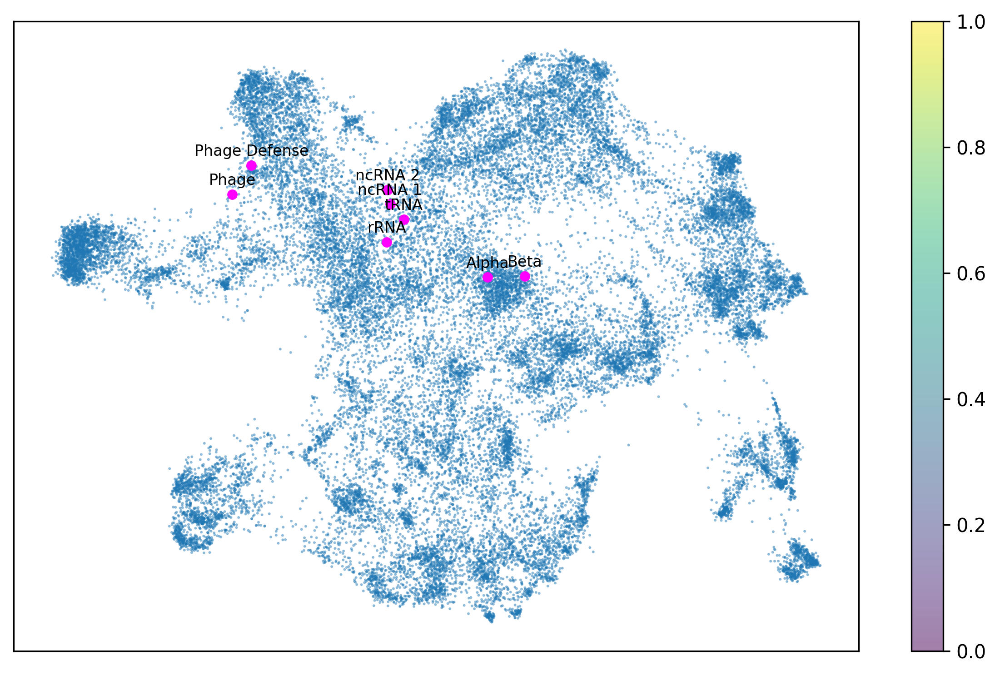

In [164]:
import matplotlib.colors as mcolors
plt.figure(figsize=(10, 6), dpi=300, frameon=False)
plt.scatter(embedding_df['UMAP 1'], embedding_df['UMAP 2'], alpha=0.5, s=2, edgecolors='none')
plt.xticks([])
plt.yticks([])
plt.colorbar()
plot_my_features(embedding_df)
plt.savefig("../output/umap_figures/umap.png")
plt.show()

In [172]:
coding_noncoding_diff_prok = np.load("../output/coding_noncoding_diff_prok.npy")

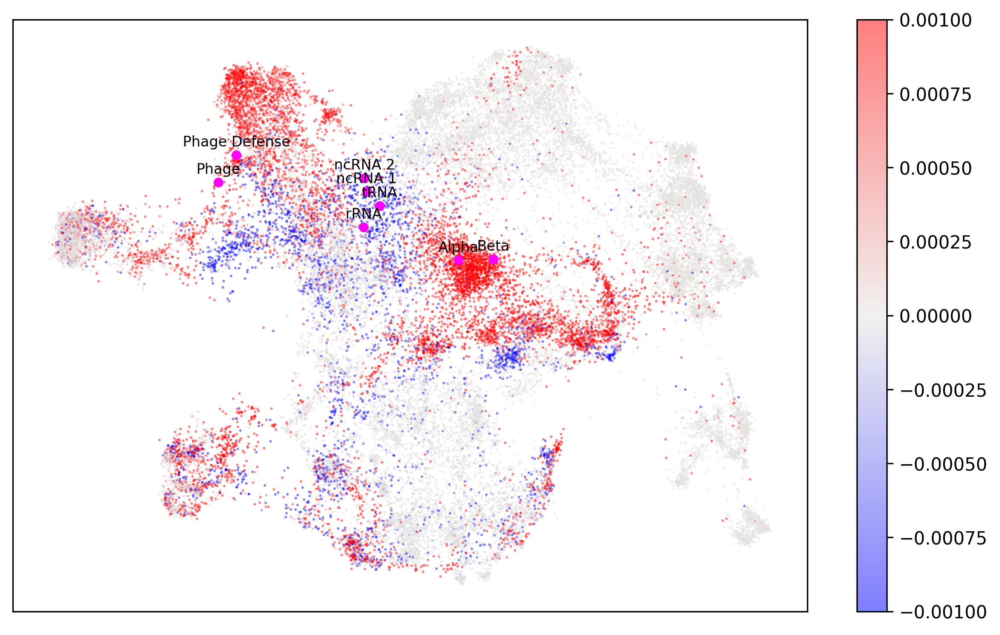

In [173]:
import matplotlib.colors as mcolors
colors = ["blue", "#E5E4E2", "red"]
n_bins = 256 # Number of bins for the colormap
cmap_name = "BlueWhiteRed"
cm = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

plt.figure(figsize=(10, 6), dpi=300, frameon=False)
plt.scatter(embedding_df['UMAP 1'], embedding_df['UMAP 2'], alpha=0.5, s=2, c=coding_noncoding_diff_prok, vmin=-1e-3, vmax=1e-3, cmap=cm, edgecolors='none')
plt.xticks([])
plt.yticks([])
plt.colorbar()
plot_my_features(embedding_df)
plt.savefig("../output/umap_figures/umap_coding_noncoding_diff_prok.png")
plt.show()

In [12]:
euk_vs_prok = np.load("../output/euk_vs_prok.npy")

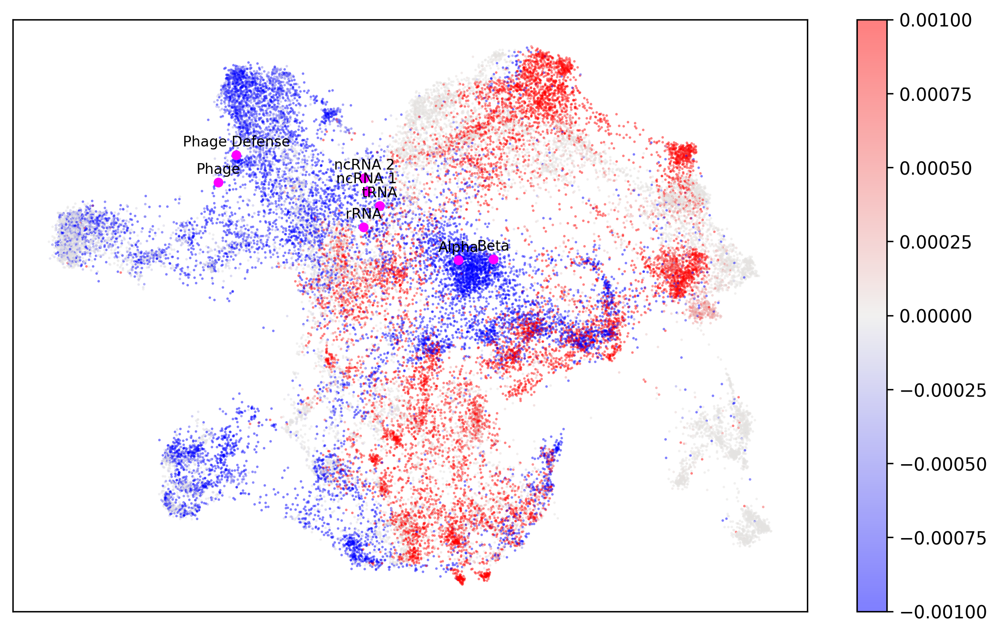

In [13]:
import matplotlib.colors as mcolors
colors = ["blue", "#E5E4E2", "red"]
n_bins = 256 # Number of bins for the colormap
cmap_name = "BlueWhiteRed"
cm = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

plt.figure(figsize=(10, 6), dpi=300, frameon=False)
plt.scatter(embedding_df['UMAP 1'], embedding_df['UMAP 2'], alpha=0.5, s=2, c=euk_vs_prok, vmin=-1e-3, vmax=1e-3, cmap=cm, edgecolors='none')
plt.xticks([])
plt.yticks([])
plt.colorbar()
plot_my_features(embedding_df)
plt.savefig("../output/umap_figures/umap_euk_vs_prok.png")
plt.show()

In [14]:
coding_noncoding_diff_euk = np.load("../output/coding_noncoding_diff_euk.npy")

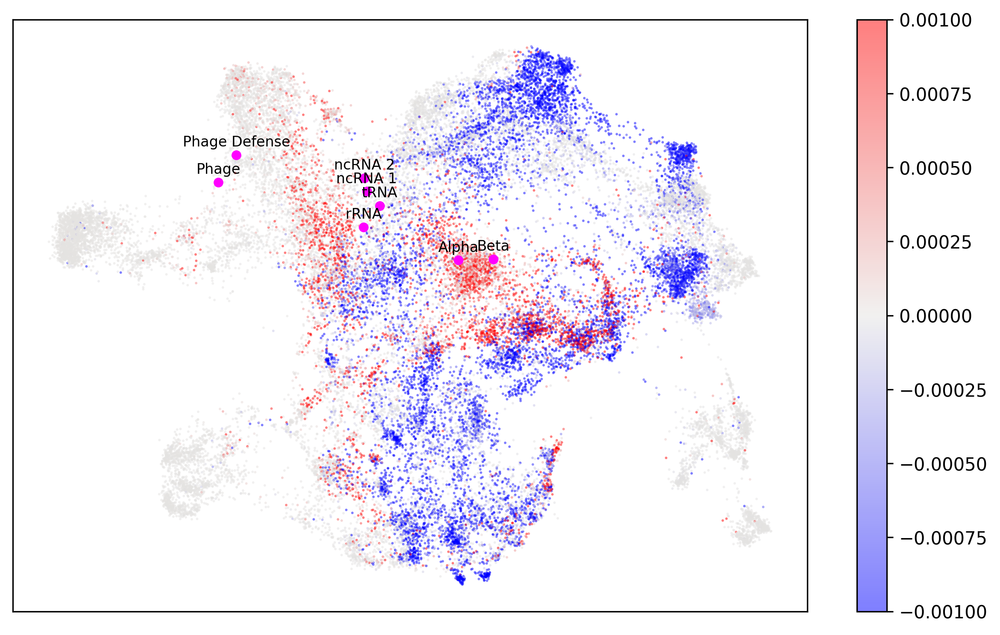

In [15]:
import matplotlib.colors as mcolors
colors = ["blue", "#E5E4E2", "red"]
n_bins = 256 # Number of bins for the colormap
cmap_name = "BlueWhiteRed"
cm = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

plt.figure(figsize=(10, 6), dpi=300, frameon=False)
plt.scatter(embedding_df['UMAP 1'], embedding_df['UMAP 2'], alpha=0.5, s=2, c=coding_noncoding_diff_euk, vmin=-1e-3, vmax=1e-3, cmap=cm, edgecolors='none')
plt.xticks([])
plt.yticks([])
plt.colorbar()
plot_my_features(embedding_df)
plt.savefig("../output/umap_figures/umap_coding_noncoding_diff_euk.png")
plt.show()

In [80]:
peak_periods = np.load("../output/NZ_CP045720.1_peak_periods.npy")
peak_magnitudes = np.load("../output/NZ_CP045720.1_peak_magnitudes.npy")

# peak_periods = np.load("../output/NC_060944.1_peak_periods.npy")
# peak_magnitudes = np.load("../output/NC_060944.1_peak_magnitudes.npy")

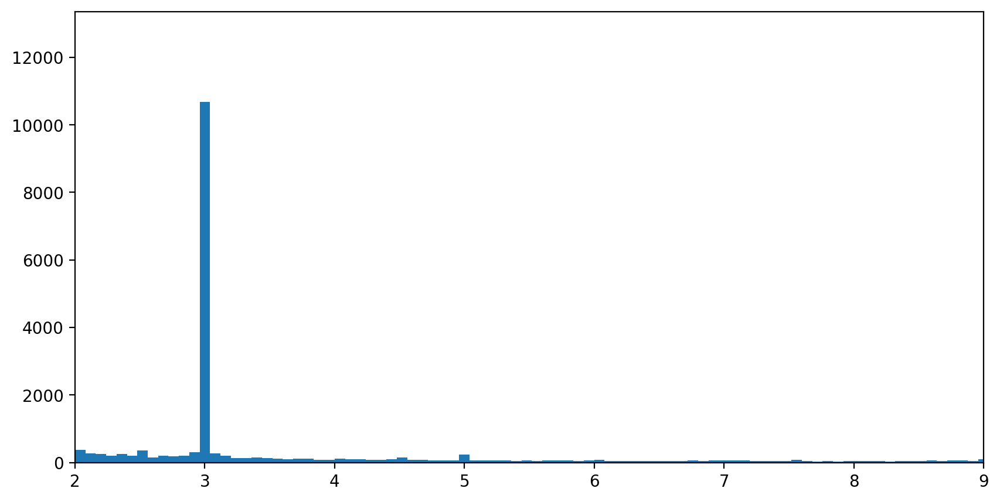

In [93]:
plt.figure(figsize=(10, 5), dpi=200)
plt.hist(peak_periods, bins=100)
plt.xlim(2, 9)
plt.show()

In [82]:
dist_from_3 = np.abs(peak_periods - 3)

In [83]:
(dist_from_3 < 0.01).mean()

0.301483154296875

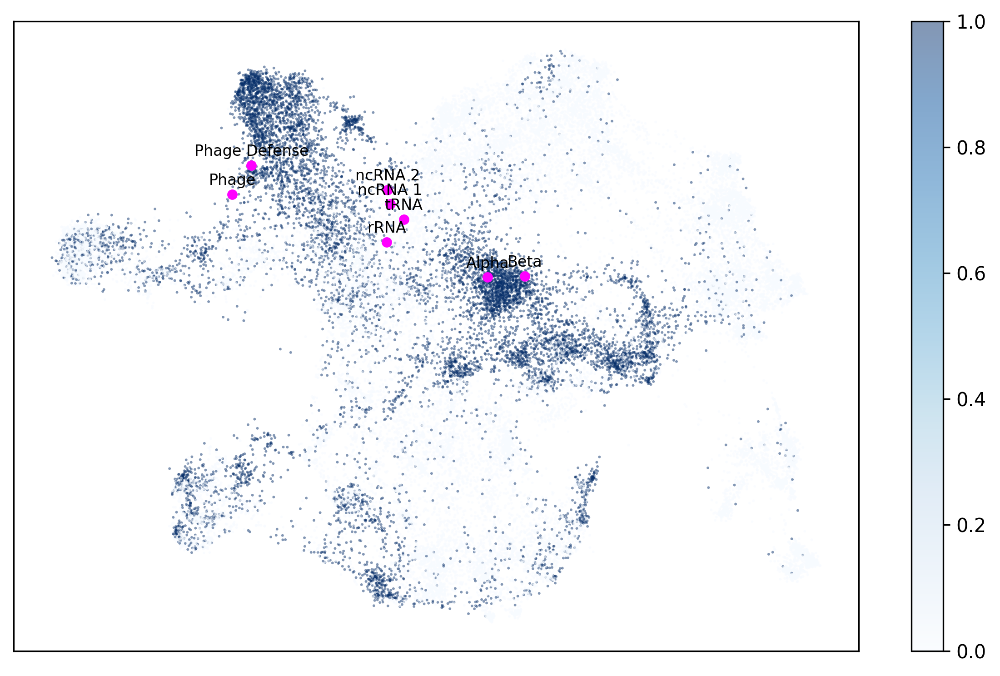

In [174]:
import matplotlib.colors as mcolors
colors = ["blue", "#E5E4E2", "red"]
n_bins = 256 # Number of bins for the colormap
cmap_name = "BlueWhiteRed"
cm = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

plt.figure(figsize=(10, 6), dpi=300, frameon=False)
plt.scatter(embedding_df['UMAP 1'], embedding_df['UMAP 2'], alpha=0.5, s=2, c=dist_from_3 < 0.01, cmap="Blues", edgecolors='none')
plt.xticks([])
plt.yticks([])
plt.colorbar()
plot_my_features(embedding_df)
plt.savefig("../output/umap_figures/umap_peak_at_3_prok.png")
plt.show()

In [195]:
np.corrcoef(dist_from_3 < 0.01, coding_noncoding_diff_prok > 0.0001)

array([[1.        , 0.74048626],
       [0.74048626, 1.        ]])

Correlation coefficient matrix:
[[1.         0.74048626]
 [0.74048626 1.        ]]
Correlation between conditions: 0.7405


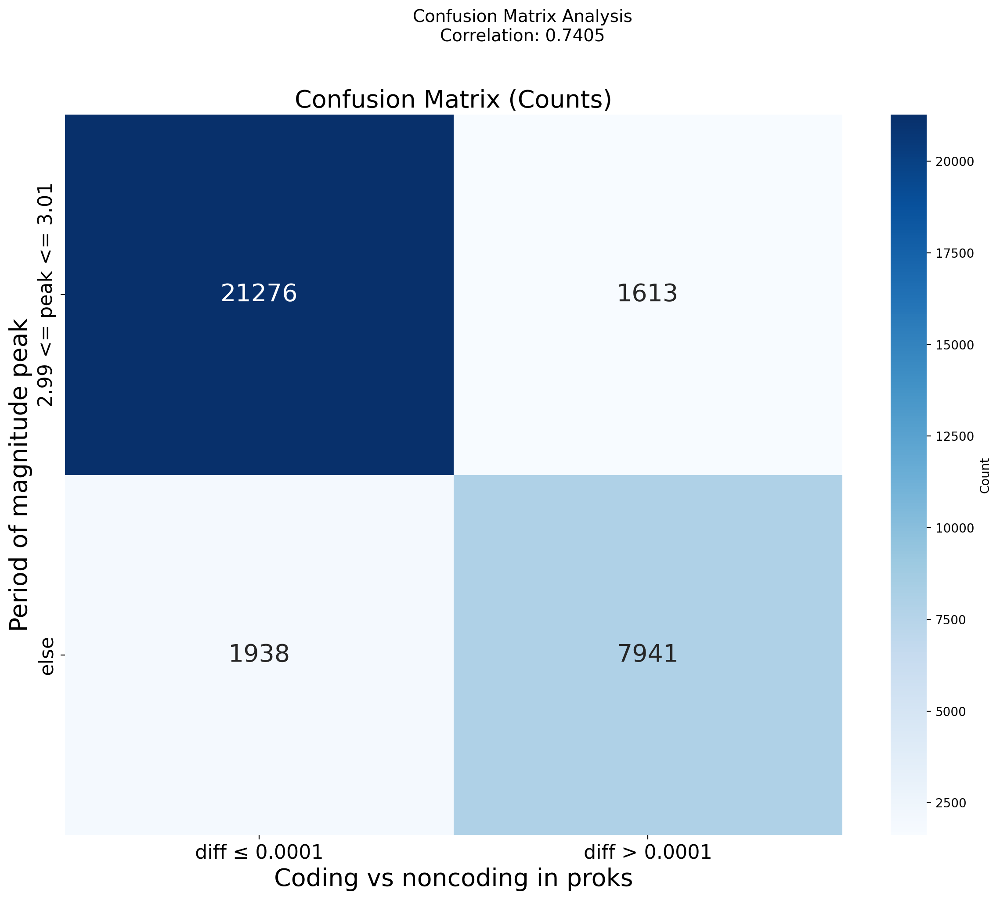

In [208]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming you have these arrays defined:
# dist_from_3: array of distances
# coding_noncoding_diff_prok: array of differences

# Create boolean conditions
condition1 = dist_from_3 < 0.01
condition2 = coding_noncoding_diff_prok > 0.0001

# Calculate correlation coefficient
corr_coef = np.corrcoef(condition1, condition2)
print(f"Correlation coefficient matrix:\n{corr_coef}")
print(f"Correlation between conditions: {corr_coef[0, 1]:.4f}")

# Create confusion matrix
# Using condition1 as "true" labels and condition2 as "predicted" labels
cm = confusion_matrix(condition1, condition2)

# Create figure with two subplots
fig, axes = plt.subplots(1, 1, figsize=(12, 10), dpi=200)

# Plot 1: Confusion Matrix with counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['diff ≤ 0.0001', 'diff > 0.0001'],
            yticklabels=['2.99 <= peak <= 3.01', 'else'],
            ax=axes, cbar_kws={'label': 'Count'},
            annot_kws={'size': 20},
           )
axes.set_xlabel('Coding vs noncoding in proks', fontsize=20)
axes.set_ylabel('Period of magnitude peak', fontsize=20)
axes.set_title('Confusion Matrix (Counts)', fontsize=20)

# Calculate percentages for normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum() * 100

axes.tick_params(axis='both', labelsize=16)

plt.suptitle(f'Confusion Matrix Analysis\nCorrelation: {corr_coef[0, 1]:.4f}', 
             fontsize=14, y=1.02)
plt.tight_layout()
plt.show()


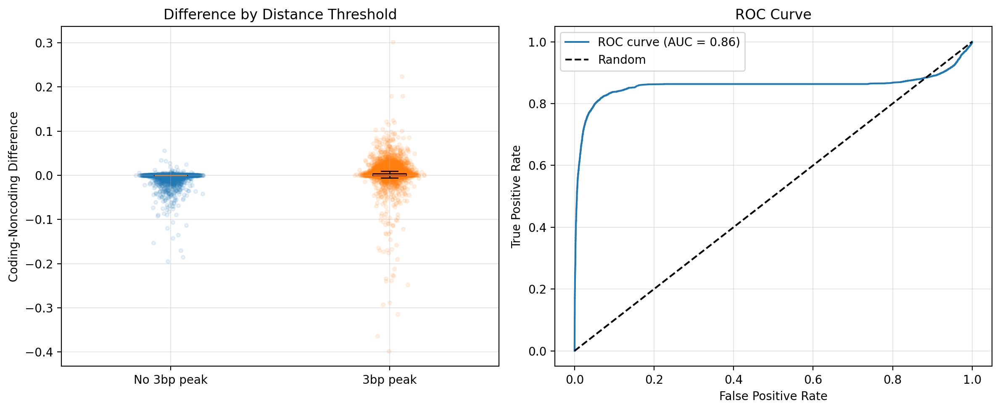

Min value: -0.3973
Max value: 0.3022
Contains negative values: True
Contains zero values: True


In [171]:
import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create binary classification based on distance threshold
y_true = dist_from_3 < 0.01
y_scores = coding_noncoding_diff_prok

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=200)

# Option 2: Use symlog scale (handles negative values)
ax1.boxplot([y_scores[~y_true], y_scores[y_true]], 
            labels=['No 3bp peak', '3bp peak'], showfliers=False)
for i, mask in enumerate([~y_true, y_true]):
    data = y_scores[mask]
    x = np.ones(len(data)) * (i + 1) + np.random.normal(0, 0.04, len(data))
    ax1.scatter(x, data, alpha=0.1, s=10)
# ax1.set_yscale('symlog')  # Symmetric log scale handles negative values
ax1.set_ylabel('Coding-Noncoding Difference')
# ax1.set_ylim(-1e-2,1e-3)

# Option 3: Keep linear scale (comment out the set_yscale line above and uncomment below)
# ax1.set_ylabel('Coding-Noncoding Difference')

ax1.set_title('Difference by Distance Threshold')
ax1.grid(True, alpha=0.3)

# 2. ROC Curve
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

ax2.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax2.plot([0, 1], [0, 1], 'k--', label='Random')
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('ROC Curve')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print min/max values to understand the data range
print(f"Min value: {np.min(y_scores):.4f}")
print(f"Max value: {np.max(y_scores):.4f}")
print(f"Contains negative values: {np.any(y_scores < 0)}")
print(f"Contains zero values: {np.any(y_scores == 0)}")

In [96]:
np.corrcoef(coding_noncoding_diff_prok, dist_from_3)

array([[ 1.        , -0.08147473],
       [-0.08147473,  1.        ]])

In [87]:
coding_noncoding_diff_prok[dist_from_3 < 0.03].mean()

0.0036230858

In [88]:
coding_noncoding_diff_prok[dist_from_3 > 0.03].mean()

-0.00091005524